In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Load data
df_benin = pd.read_csv('../data/benin.csv', parse_dates=['Timestamp'])

# Overview
df_benin.info()
df_benin.head()





<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Timestamp      525600 non-null  datetime64[ns]
 1   GHI            525600 non-null  float64       
 2   DNI            525600 non-null  float64       
 3   DHI            525600 non-null  float64       
 4   ModA           525600 non-null  float64       
 5   ModB           525600 non-null  float64       
 6   Tamb           525600 non-null  float64       
 7   RH             525600 non-null  float64       
 8   WS             525600 non-null  float64       
 9   WSgust         525600 non-null  float64       
 10  WSstdev        525600 non-null  float64       
 11  WD             525600 non-null  float64       
 12  WDstdev        525600 non-null  float64       
 13  BP             525600 non-null  int64         
 14  Cleaning       525600 non-null  int64         
 15  

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01:00,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02:00,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03:00,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04:00,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05:00,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN


In [22]:
# Summary statistics
df_benin.describe()

# Missing value report
missing_report = df_benin.isna().sum()
missing_report[missing_report > 0].sort_values(ascending=False)

# columns with > 5% missing
missing_percent = df_benin.isna().mean() * 100
print(missing_percent[missing_percent > 5])


Comments    100.0
dtype: float64


In [25]:
#outlier detection
cols_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']

df_benin_zscore = df_benin[cols_to_check].apply(zscore)
outliers = (df_benin_zscore.abs() > 3).any(axis=1)
print(f"Number of outliers detected: {outliers.sum()}")

# Impute missing with median
for col in cols_to_check:
    median = df_benin[col].median()
    df_benin[col] = df_benin[col].fillna(median)

df_benin_clean = df_benin[~outliers].copy()


Number of outliers detected: 7740


In [24]:
#save cleaned data
clean_path = "/data/benin_clean.csv"
df_benin_clean.to_csv('../data/benin_clean.csv', index=False)
print(f"Cleaned data saved to {clean_path}")


Cleaned data saved to /data/benin_clean.csv


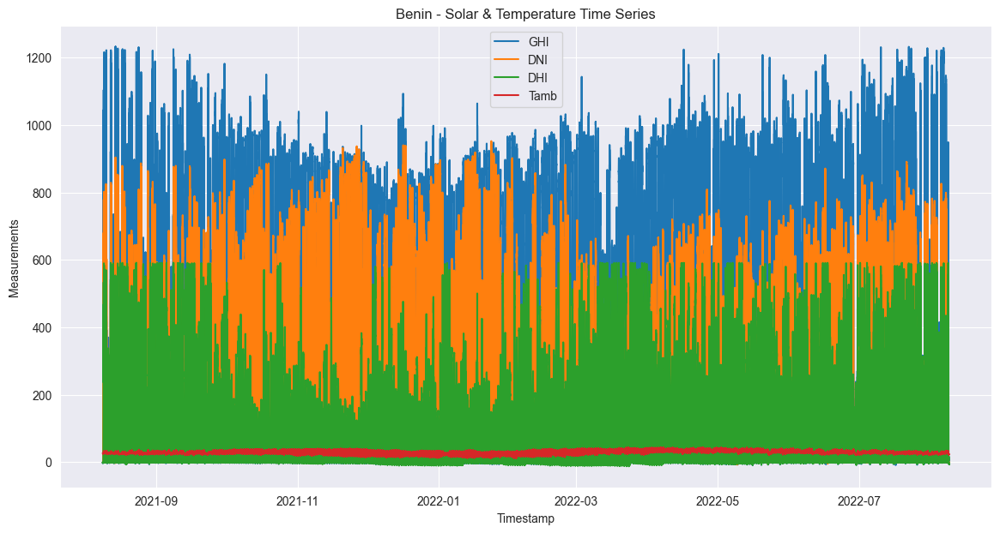

In [26]:
#Plot Time Series
plt.figure(figsize=(14,7))
plt.plot(df_benin_clean['Timestamp'], df_benin_clean['GHI'], label='GHI')
plt.plot(df_benin_clean['Timestamp'], df_benin_clean['DNI'], label='DNI')
plt.plot(df_benin_clean['Timestamp'], df_benin_clean['DHI'], label='DHI')
plt.plot(df_benin_clean['Timestamp'], df_benin_clean['Tamb'], label='Tamb')
plt.legend()
plt.title('Benin - Solar & Temperature Time Series')
plt.xlabel('Timestamp')
plt.ylabel('Measurements')
plt.show()

 

In [ ]:
# Cleaning impact on sensor performance
df_benin_clean.groupby('Cleaning')[['ModA', 'ModB']].mean().plot(kind='bar', title='Avg ModA & ModB by Cleaning Event')
plt.ylabel("Irradiance")
plt.show()


Average ModA & ModB by Cleaning flag:
                ModA       ModB
Cleaning                       
0         232.323881  224.95509
1         306.610124  301.45000


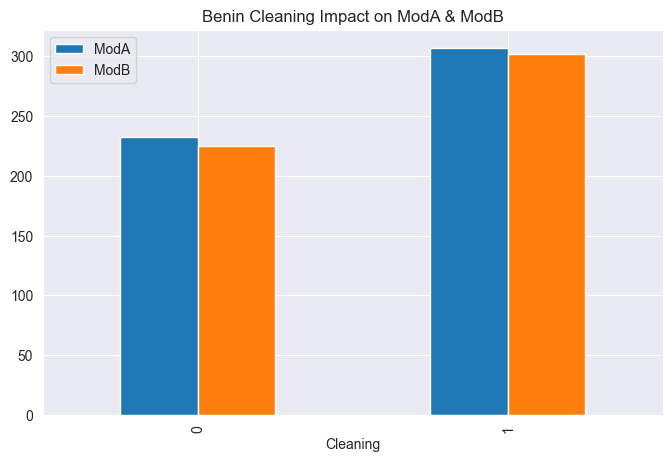

In [28]:
#Cleaning Impact on ModA and ModB

cleaning_group = df_benin_clean.groupby('Cleaning')[['ModA', 'ModB']].mean()
print("Average ModA & ModB by Cleaning flag:")
print(cleaning_group)

cleaning_group.plot(kind='bar', figsize=(8,5), title='Benin Cleaning Impact on ModA & ModB')
plt.show()


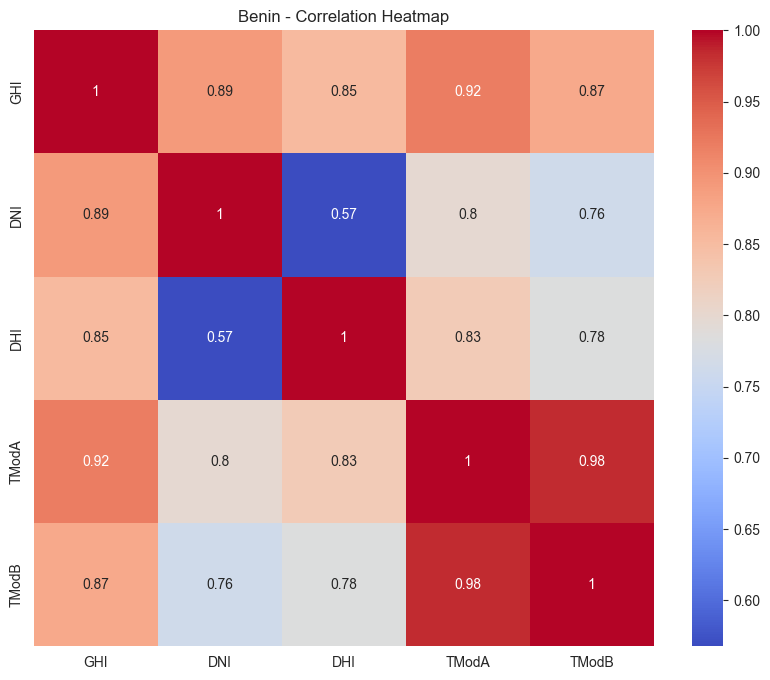

In [29]:
# Correlation Heatmap
plt.figure(figsize=(10,8))
sns.heatmap(df_benin_clean[['GHI', 'DNI', 'DHI', 'TModA', 'TModB']].corr(), annot=True, cmap='coolwarm')
plt.title('Benin - Correlation Heatmap')
plt.show()

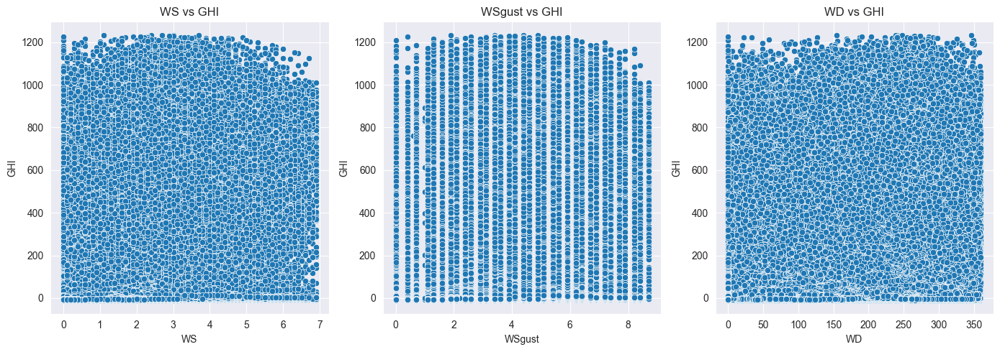

In [30]:
#Scatter Plots WS, WSgust, WD vs GHI
plt.figure(figsize=(14,5))

plt.subplot(1,3,1)
sns.scatterplot(x='WS', y='GHI', data=df_benin_clean)
plt.title('WS vs GHI')

plt.subplot(1,3,2)
sns.scatterplot(x='WSgust', y='GHI', data=df_benin_clean)
plt.title('WSgust vs GHI')

plt.subplot(1,3,3)
sns.scatterplot(x='WD', y='GHI', data=df_benin_clean)
plt.title('WD vs GHI')

plt.tight_layout()
plt.show()


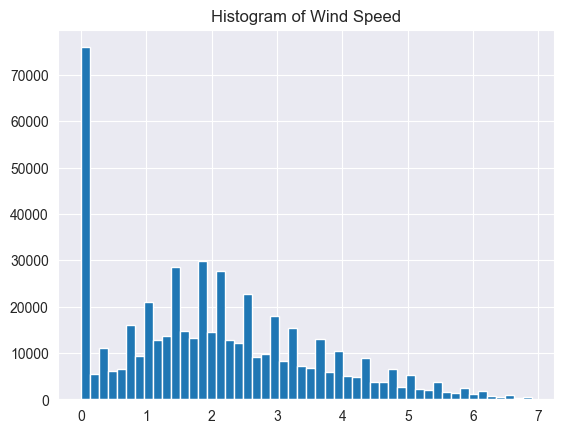

In [31]:
# Histogram of WS
df_benin_clean['WS'].hist(bins=50)
plt.title("Histogram of Wind Speed")

# Wind direction rose (radial)
import plotly.express as px
fig = px.bar_polar(df_benin_clean, r="WS", theta="WD", color="WS", template="plotly_dark")
fig.show()


Text(0.5, 1.0, 'RH vs Tamb')

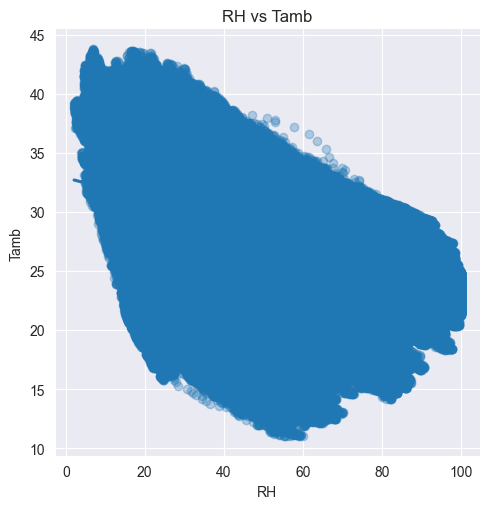

In [33]:
#temperture analysis
sns.lmplot(data=df_benin_clean, x='RH', y='Tamb', scatter_kws={"alpha":0.3})
plt.title("RH vs Tamb")


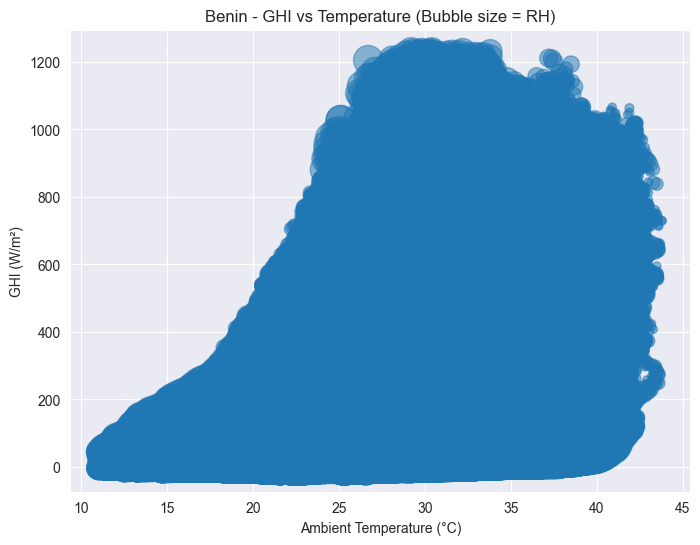

In [32]:
#Bubble Chart GHI vs Tamb (Bubble size = RH)
plt.figure(figsize=(8,6))
sizes = df_benin_clean['RH'] * 5
plt.scatter(df_benin_clean['Tamb'], df_benin_clean['GHI'], s=sizes, alpha=0.5)
plt.xlabel('Ambient Temperature (°C)')
plt.ylabel('GHI (W/m²)')
plt.title('Benin - GHI vs Temperature (Bubble size = RH)')
plt.show()
